# Applying SEraster on a CODEX Human Spleen Dataset
## Spatial Variable Gene (SVG) Analysis using nnSVG and Cell-Type Co-Enrichment Analysis using CooccurrenceAffinity
### Created by [Gohta Aihara](https://orcid.org/0000-0002-2492-9610) (Supervised by Dr. Jean Fan, Johns Hopkins University)
### HuBMAP Annual Meeting 2024

In this tutorial, we will analyze a CODEX dataset for human spleen (HuBMAP ID: HBM825.KFFT.669). The same dataset can be found on the [HuBMAP data portal](https://portal.hubmapconsortium.org/browse/dataset/2c70846a788a7b6900992b4ed310574d). We will use SEraster to the Cytokit and SPRM outputs to reduce the number of spatial points through rasterization. Then, we will use nnSVG to identify spatially variable genes (SVGs) and CooccurrenceAffinity to evaluate cell-type co-enrichment analysis. Since the analyzed dataset is a spatial proteomics dataset, it is important to note that SVGs would refer to spatially variable proteins. 

SEraster's GitHub repository and bioRxiv preprint can be found below:
* [SEraster GitHub repo](https://github.com/JEFworks-Lab/SEraster)
* [Aihara G. et al. (2024), "SEraster: a rasterization preprocessing framework for scalable spatial omics data analysis", *bioRxiv*](https://doi.org/10.1101/2024.02.01.578436)

References for nnSVG and CooccurrenceAffinity can be found below:
* [Weber, L. et al. (2023), "nnSVG for the scalable identification of spatially variable genes using nearest-neighbor Gaussian processes", *Nature Communications*](https://doi.org/10.1038/s41467-023-39748-z)
* [Mainali, K. et al. (2021), "A better index for analysis of co-occurrence and similarity", *Science Advances*](https://doi.org/10.1126/sciadv.abj9204)
* [Mainali,K. et al. (2022), "CooccurrenceAffinity: An R package for computing a novel metric of affinity in co-occurrence data that corrects for pervasive errors in traditional indices", *bioRxiv*](https://doi.org/10.1101/2022.11.01.514801)

## Load necessary packages

In [11]:
# rasterization
library(SEraster)

# data infrastructure
library(SpatialExperiment, quietly = TRUE)
library(Matrix, quietly = TRUE)

# parallelization
library(BiocParallel, quietly = TRUE)

# downstream spatial analysis
library(nnSVG, quietly = TRUE)
library(CooccurrenceAffinity)

# data processing/plotting
library(tidyverse, quietly = TRUE)
library(reshape, quietly = TRUE)
library(ggrepel, quietly = TRUE)
library(gridExtra, quietly = TRUE)
library(ComplexHeatmap, quietly = TRUE)

# directory
library(here, quietly = TRUE)

## Set up parameters

In [12]:
# set up number of core(s) used for parallelization
n_core <- 1

## Load dataset

The subsetted has cells. For rasterizing protein expression with `SEraster`, the input `SpatialExperiment` needs to have a proteins-by-cells matrix (either dense or sparse matrix) in the `assay` slot and a spatial coordinates matrix in the `spatialCoords` slot. For rasterizing cell-type labels with `SEraster`, in addition to the spatial coordinates matrix in the `spatialCoords` slot, the input `SpatialExperiment` also need to have a data frame with a column for cell-type labels in the `colData` slot. Thus, here, we extract proteins-by-cells matrix, spatial coordinates matrix, and data frame with cell-type labels. Since cell-type labels are not provided, we will use cluster labels in this tutorial.

In [13]:
hubmap_id <- 'HBM825.KFFT.669'

In [14]:
# datasets are directly loaded from a local directory. Please make sure to adjust to your directory.
# load mean intensity of pixel intensities for all parts of each cell for all channels (proteins-by-cells matrix)
exp <- read.csv(file = here(hubmap_id, 'reg1_stitched_expressions.ome.tiff-cell_channel_meanAll.csv')) %>%
    column_to_rownames(var = 'ID')
exp <- t(as.matrix(exp))

# load spatial coordinates of cell centers of each segmented cell
pos <- read.csv(file = here(hubmap_id, 'reg1_stitched_expressions.ome.tiff-cell_centers.csv'))

# load cluster labels
cluster <- read.csv(file = here(hubmap_id, 'reg1_stitched_expressions.ome.tiff-cell_cluster.csv'))

In [15]:
# subset the spatial coordinates to the same set of cells we have protein expressions for
pos_sub <- pos[pos$ID %in% colnames(exp),] %>%
    remove_rownames() %>%
    column_to_rownames(var = 'ID')

# subset the cluster labels to the same set of cells we have protein expressions for
cluster_sub <- cluster[cluster$ID %in% colnames(exp),] %>%
    column_to_rownames(var = 'ID')

# sanity check
identical(rownames(pos_sub), rownames(cluster_sub))

[1] TRUE

In [16]:
# adjust cell IDs
colnames(exp) <- rownames(pos_sub) <- rownames(cluster_sub) <- paste0("cell-", colnames(exp))

Since each column of the cluster data frame represents cluster labels found with a specific clustering method, we will arbituarly select one method to base our cell-type co-enrichment analysis.

In [17]:
# select cluster method to evaluate
col_name <- 'K.Means..tSNE_All_Features.'

In [18]:
# extract cluster labels
ct_labels <- factor(cluster_sub[,col_name])

# set colors for each cluster
gg_color_hue <- function(n) {
  hues = seq(15, 375, length = n + 1)
  hcl(h = hues, l = 65, c = 100)[1:n]
}
col_clu <- gg_color_hue(length(levels(ct_labels)))
names(col_clu) <- levels(ct_labels)

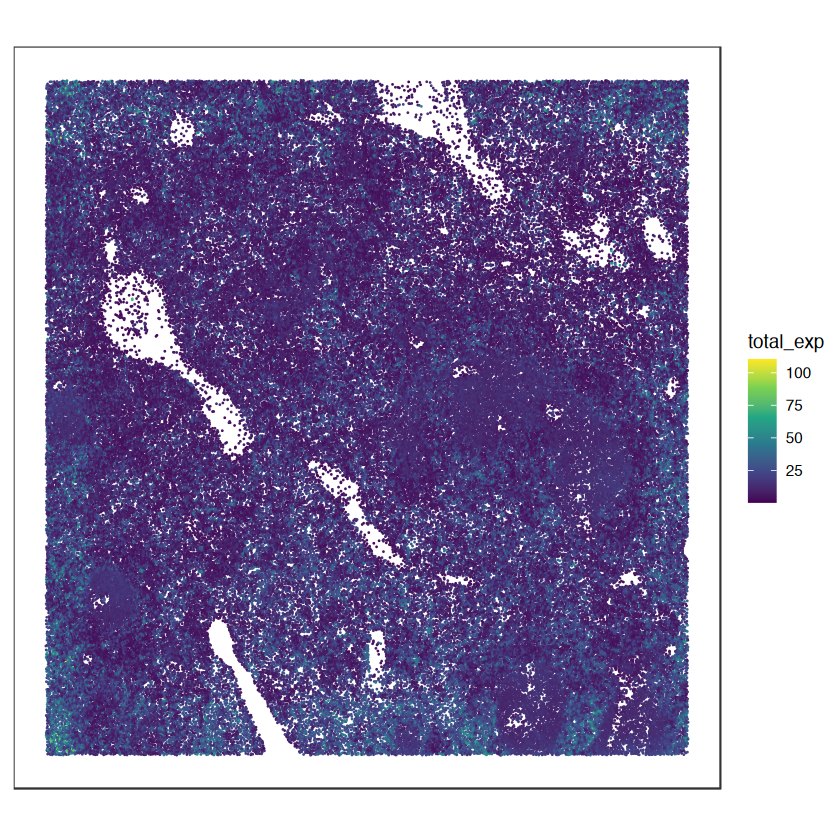

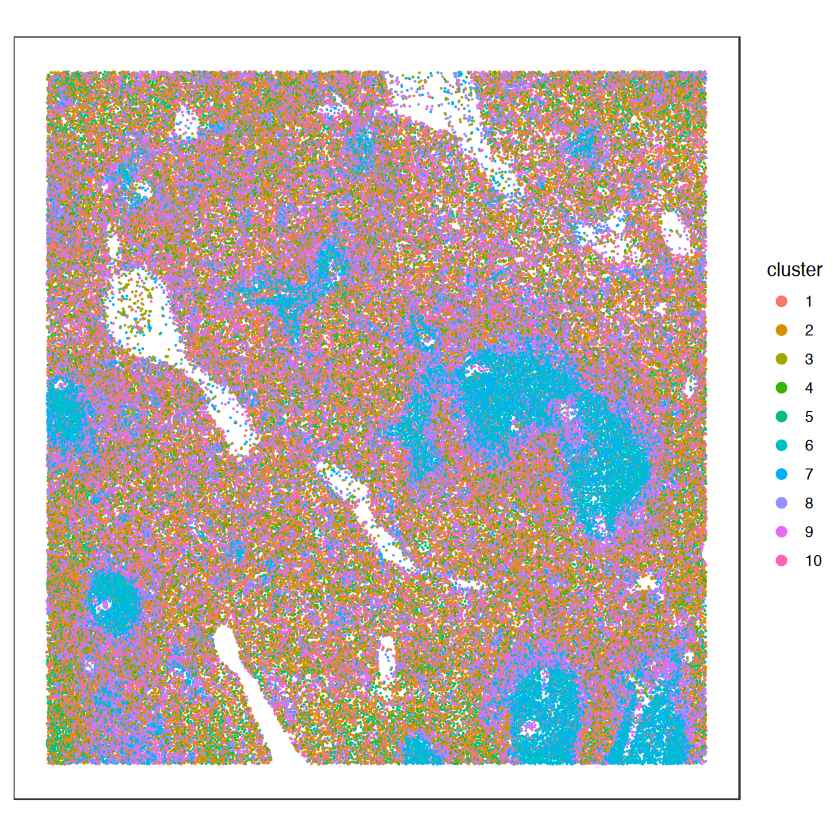

In [19]:
df_plt <- data.frame(pos_sub, total_exp = colSums(exp), cluster = factor(cluster_sub[,col_name]))

# visualize total protein expression at single-cell resolution
ggplot(df_plt, aes(x = x, y = y, col = total_exp)) +
    coord_fixed() +
    geom_point(size = 0.5, stroke = 0) +
    scale_color_viridis_c() +
    theme_bw() +
    theme(panel.grid = element_blank(),
        axis.title = element_blank(),
        axis.text = element_blank(),
        axis.ticks = element_blank())

# visualize cluster labels at single-cell resolution
ggplot(df_plt, aes(x = x, y = y, col = cluster)) +
    coord_fixed() +
    geom_point(size = 0.5, stroke = 0) +
    scale_color_manual(values = col_clu) +
    guides(col = guide_legend(override.aes = list(size = 3))) +
    theme_bw() +
    theme(panel.grid = element_blank(),
        axis.title = element_blank(),
        axis.text = element_blank(),
        axis.ticks = element_blank())

In [20]:
# format into a SpatialExperiment object
spe <- SpatialExperiment(
    assay = list(intensity = exp),
    spatialCoords = as.matrix(pos_sub),
    colData = cluster_sub
)

There are 132,140 cells in the dataset.

In [21]:
# check the dimensions
dim(spe)

[1]     29 132140

## SVG analysis with nnSVG

In [22]:
# perform SVG analysis on the single-cell dataset with nnSVG
system.time(
    spe <- nnSVG::nnSVG(
        spe,
        assay_name = "intensity",
        BPPARAM = BiocParallel::MulticoreParam(workers = n_core)
    )
)

    user   system  elapsed 
1592.134  208.717 1840.903 

In [23]:
# rasterize protein expression at 100 um resolution with hexagonal pixels
system.time(
    spe_rast <- rasterizeGeneExpression(spe, assay_name = 'intensity', resolution = 100, fun = 'mean', square = FALSE, BPPARAM = MulticoreParam(workers = n_core))
)

   user  system elapsed 
 51.049  14.021  65.519 

SEraster reduced the number of points to 10,814 pixels.

In [24]:
dim(spe_rast)

[1]    29 10814

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


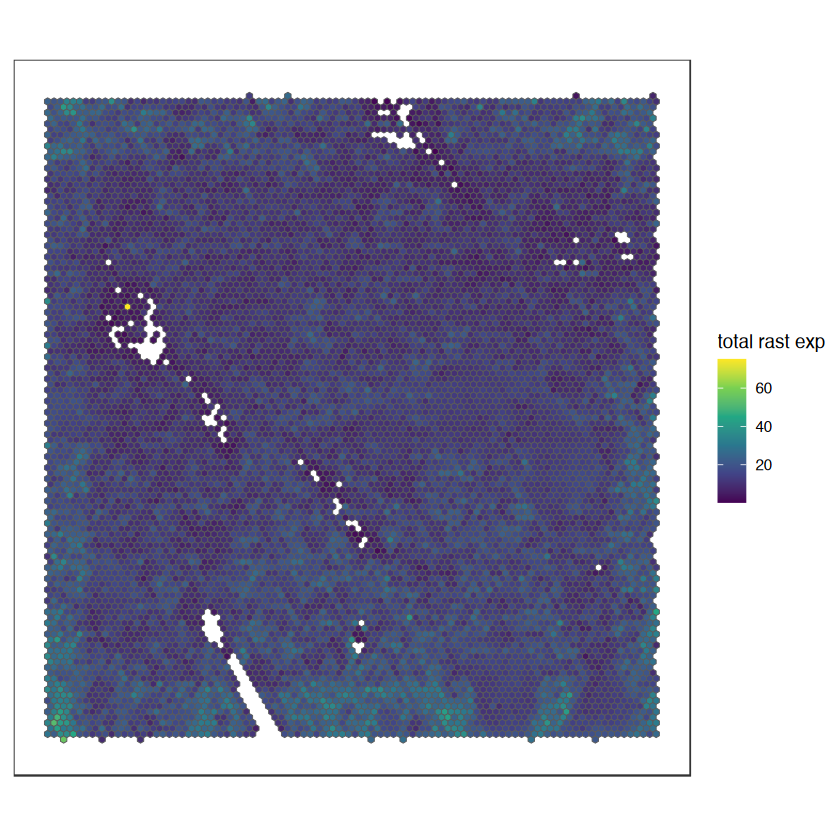

In [25]:
# visualize total rasterized protein expression
plotRaster(spe_rast, name = 'total rast exp')

In [26]:
# perform SVG analysis on the rasterized dataset with nnSVG
system.time(
    spe_rast <- nnSVG::nnSVG(
        spe_rast,
        assay_name = "pixelval",
        BPPARAM = BiocParallel::MulticoreParam(workers = n_core)
    )
)

   user  system elapsed 
128.953  10.017 139.443 

Warning message in geom_abline(intercept = 0, slope = 1, lientype = "dashed", color = "red"):
"Ignoring unknown parameters: `lientype`"


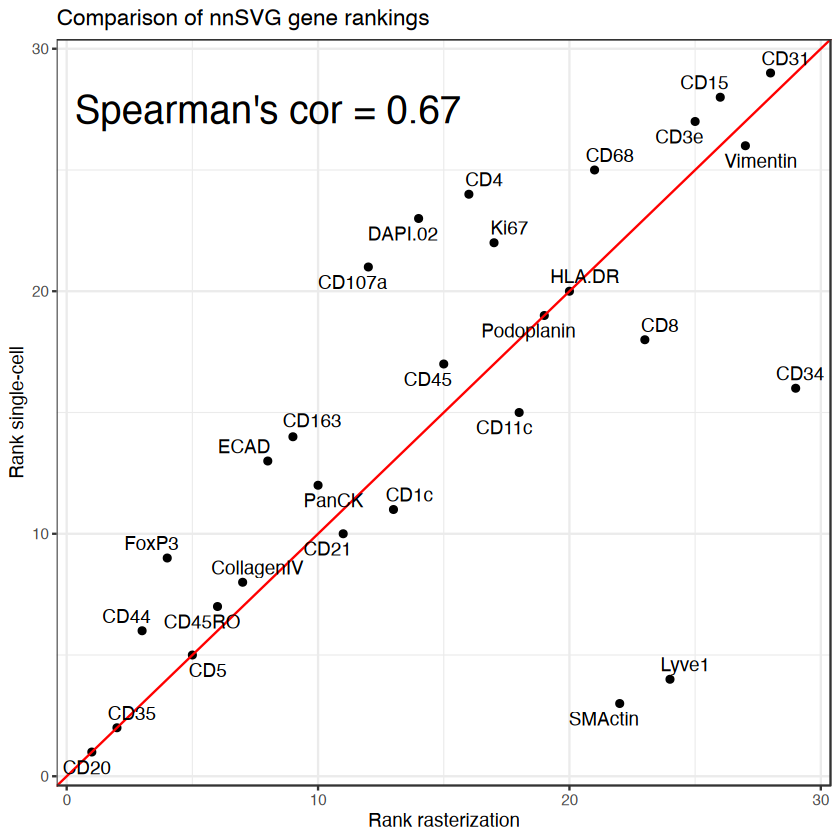

In [27]:
# compare nnSVG results at single-cell vs. rasterized resolutions
nnsvg_results_sc <- rowData(spe)
nnsvg_results_rast <- rowData(spe_rast)
df_plt <- data.frame(gene = rownames(nnsvg_results_sc), rank_sc = nnsvg_results_sc$rank, rank_rast = nnsvg_results_rast$rank)
cor <- cor(nnsvg_results_sc$rank, nnsvg_results_rast$rank, method = 'spearman')
df_plt_cor <- data.frame(x = 8, y = 27.5, label = paste0("Spearman's cor = ", round(cor, 2)))

ggplot(df_plt, aes(x = rank_rast, y = rank_sc, label = gene)) +
    geom_point() +
    geom_abline(intercept = 0, slope = 1, lientype = "dashed", color = "red") +
    geom_text_repel() +
    labs(title = "Comparison of nnSVG gene rankings", x = "Rank rasterization", y = "Rank single-cell") +
    geom_text(data = df_plt_cor, aes(x = x, y = y, label = label), size = 8, color = "black") +
    theme_bw()

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


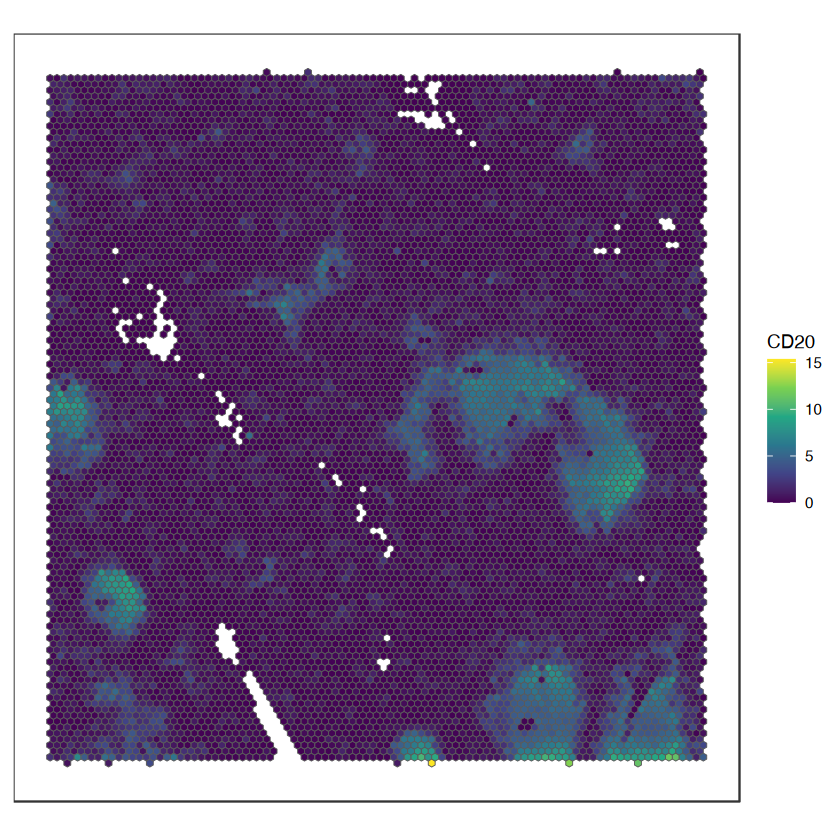

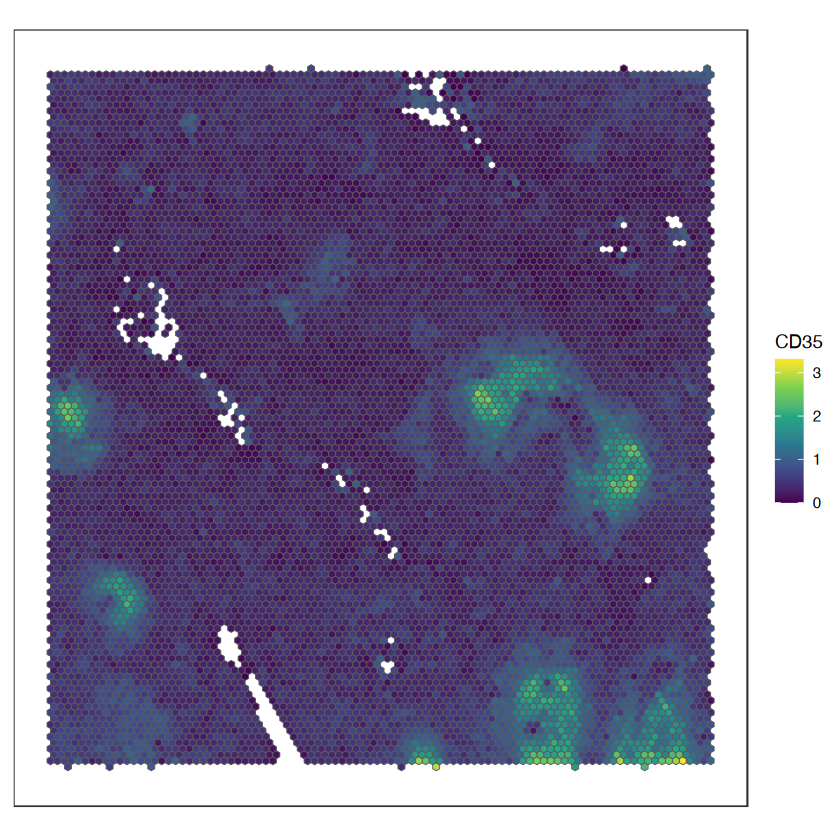

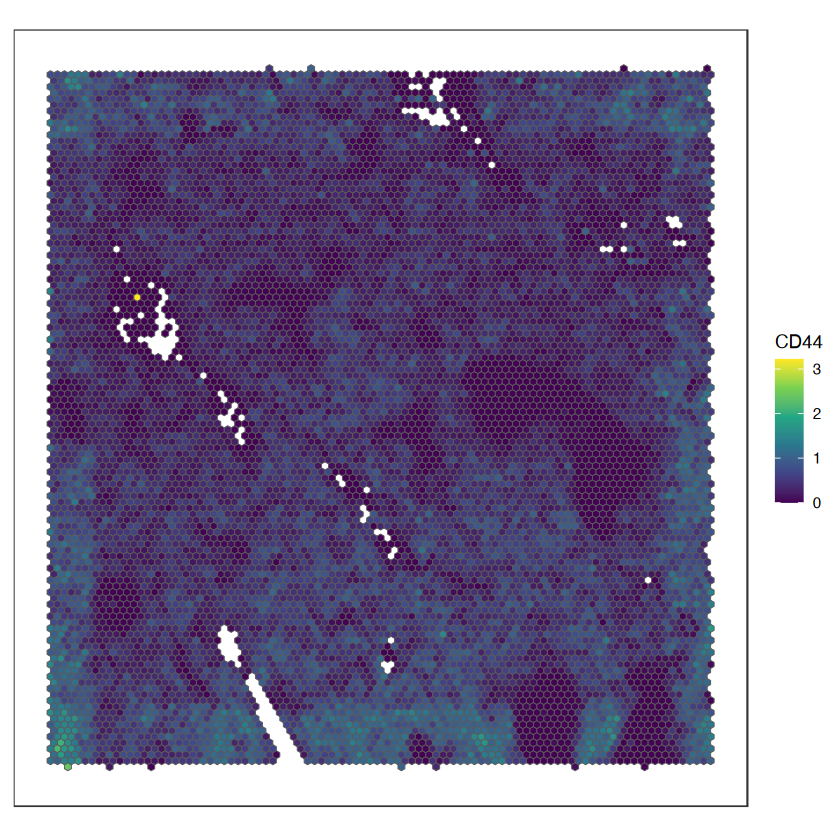

In [28]:
# visualize rasterized protein expression of top-ranked SVG
for (i in seq(3)) {
    top_svg <- which(rowData(spe_rast)$rank == i)
    top_svg_name <- rownames(rowData(spe_rast))[top_svg]
    plt <- plotRaster(spe_rast, feature_name = top_svg_name, name = top_svg_name)
    show(plt)
}

## Cell-type (Cluster) co-enrichment analysis

In [29]:
# rasterize selected cluster labels at 100 um resolution with hexagonal pixels
system.time(
    spe_rast <- rasterizeCellType(spe, col_name = col_name, resolution = 100, fun = 'sum', square = FALSE, BPPARAM = MulticoreParam(workers = n_core))
)

   user  system elapsed 
 56.750   8.902  65.797 

In [30]:
# compute relative enrichment (RE) metric (the output is dense matrix)
mat <- assay(spe_rast, "pixelval")
mat_re <- do.call(rbind, lapply(rownames(spe_rast), function(ct_label) {
    # relative enrichment = celltype observed / celltype expected = celltype observed / (celltype frequency * total # of cells in the pixel)
    mat[ct_label,] / (sum(mat[ct_label,]) / sum(mat) * colSums(mat))
}))
rownames(mat_re) <- rownames(mat)

# binarize (1 if RE >= 1, 0 if RE < 1)
mat_bin <- ifelse(mat_re >= 1, 1, 0)

# add RE and binary layers to SpatialExperiment object
assays(spe_rast) <- list(pixelval = assay(spe_rast, "pixelval"), re = mat_re, bin = mat_bin)

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


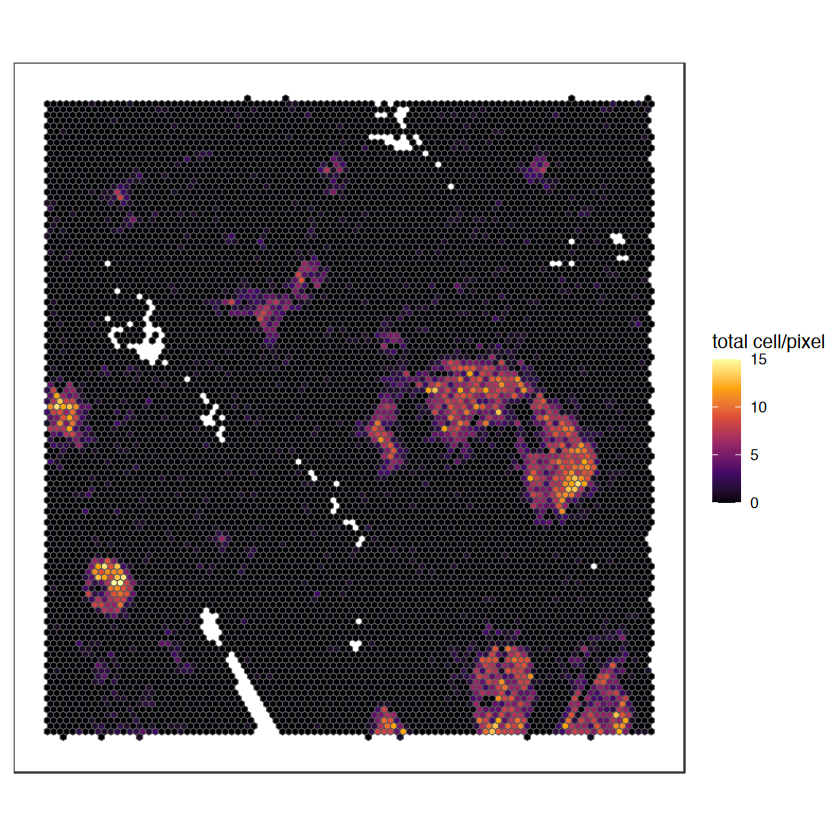

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


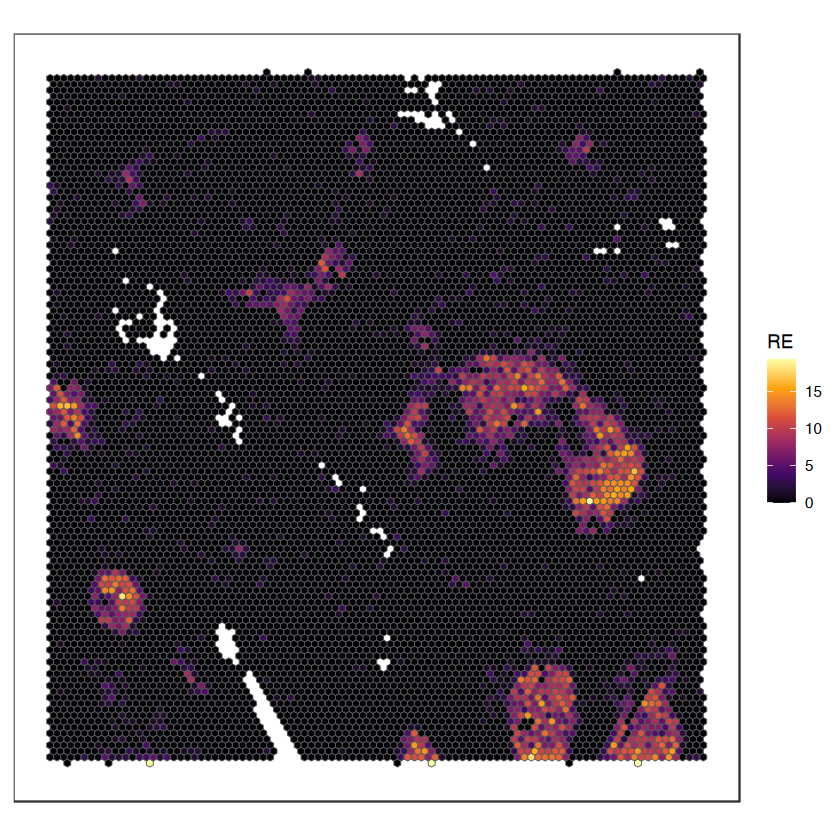

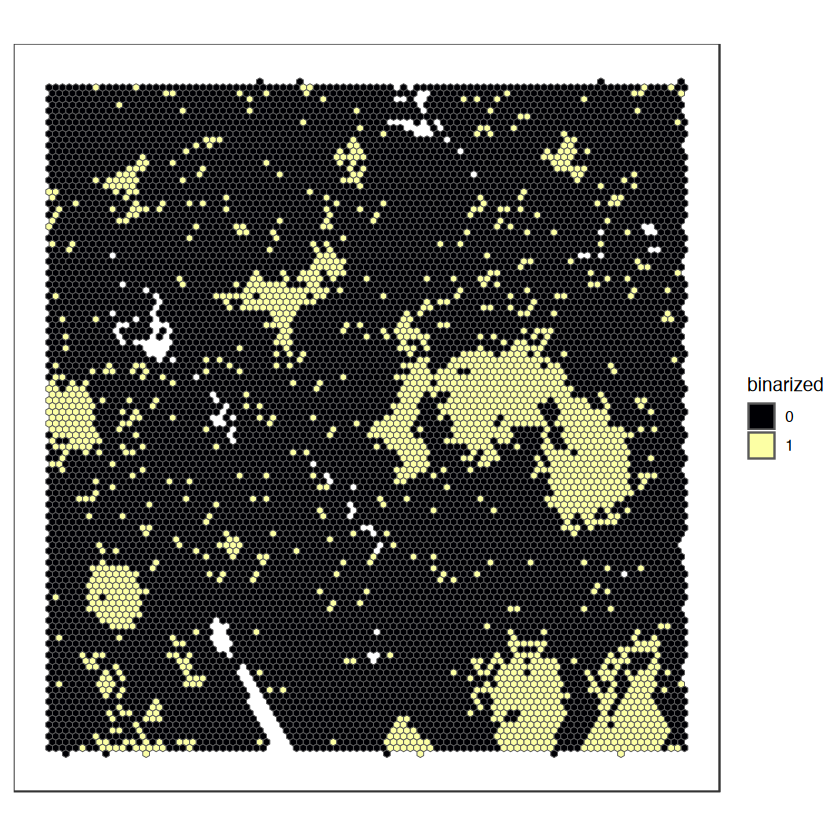

In [31]:
cluster_of_interest <- '6'

# visualize rasterized cluster counts
plotRaster(spe_rast, assay_name = 'pixelval', feature_name = cluster_of_interest, name = 'total cell/pixel', option = 'inferno')

# visualize RE of cluster of interest
plotRaster(spe_rast, assay_name = 're', feature_name = cluster_of_interest, name = 'RE', option = 'inferno')

# visualzie binarized value of cluster of interest
plotRaster(spe_rast, assay_name = 'bin', feature_name = cluster_of_interest, factor_levels = c(0,1), name = 'binarized', option = 'inferno')

In [32]:
# set CooccurrenceAffinity parameters
# set confidence interval method ("CP", "Blaker", "midQ", or "midP")
CI_method <- "Blaker"
# create a dictionary and index of CI method
CI_method_dict <- c("CP" = 6, "Blaker" = 7, "midQ" = 8, "midP" = 9)
# set confidence interval level (default = 0.95)
CI_lev <- 0.95
# set pval method ("Blaker" or "midP", default = "Blaker")
pval_method <- "Blaker"

In [33]:
# compute affinity MLE using CooccurrenceAffinity (store the log-affinity metric, CI, and pvalue for each pair)
# get pair combinations
non_self <- combn(levels(ct_labels), 2, simplify = FALSE)
self <- lapply(levels(ct_labels), function(ct_label) c(ct_label, ct_label))
pairs <- c(non_self, self)

# multiply pixel values for each pair of cell types
affinity_results <- do.call(rbind, lapply(pairs, function(pair) {
# check if cell type labels in pair exist in the dataset
if (pair[1] %in% rownames(mat_bin) & pair[2] %in% rownames(mat_bin)) {
        # create a 2x2 contingency table of counts
        cont_tab <- table(factor(mat_bin[pair[1],], levels = c(0,1)), factor(mat_bin[pair[2],], levels = c(0,1)))
        X <- cont_tab[2,2]
        mA <- sum(cont_tab[2,])
        mB <- sum(cont_tab[,2])
        N <- sum(cont_tab)
        
        out <- CooccurrenceAffinity::ML.Alpha(X,c(mA,mB,N), lev = CI_lev, pvalType = pval_method)
        
        # set index for the chosen CI method
        CI_idx <- CI_method_dict[CI_method][[1]]
        
        return(data.frame(
            pair = paste(pair, collapse = " & "),
            celltypeA = factor(pair[1], levels = levels(ct_labels)),
            celltypeB = factor(pair[2], levels = levels(ct_labels)),
            X = X,
            mA = mA,
            mB = mB,
            N = N,
            alpha = out$est,
            ci.min = out[CI_idx][[1]][1], 
            ci.max = out[CI_idx][[1]][2], 
            pval = out$pval)
        )
    }
}))

Warning message in AlphInts(x, marg, lev = lev, scal = scal, pvalType = pvalType):
"MLE = Infty is capped, along with upper confidence limits 
"
Warning message in AcceptAffCI(x, marg, lev, Int2):
"NAs introduced by coercion"
Warning message in AlphInts(x, marg, lev = lev, scal = scal, pvalType = pvalType):
"MLE = Infty is capped, along with upper confidence limits 
"
Warning message in AcceptAffCI(x, marg, lev, Int2):
"NAs introduced by coercion"
Warning message in AlphInts(x, marg, lev = lev, scal = scal, pvalType = pvalType):
"MLE = Infty is capped, along with upper confidence limits 
"
Warning message in AcceptAffCI(x, marg, lev, Int2):
"NAs introduced by coercion"
Warning message in AlphInts(x, marg, lev = lev, scal = scal, pvalType = pvalType):
"MLE = Infty is capped, along with upper confidence limits 
"
Warning message in AcceptAffCI(x, marg, lev, Int2):
"NAs introduced by coercion"
Warning message in AlphInts(x, marg, lev = lev, scal = scal, pvalType = pvalType):
"MLE = Infty 

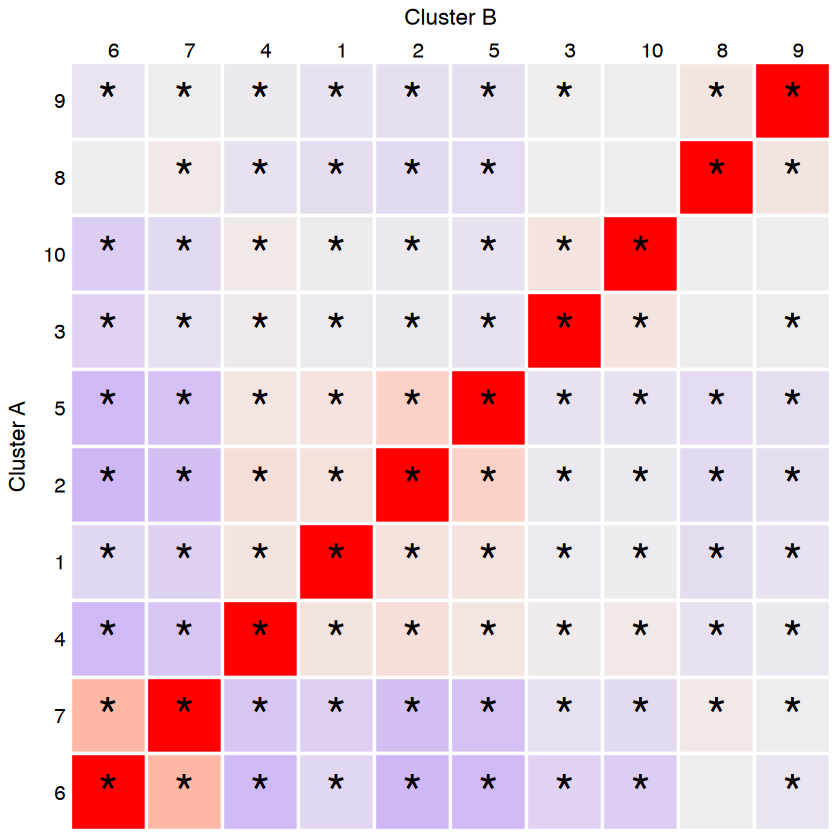

In [34]:
# create symmetric data
df_flipped <- affinity_results[affinity_results$celltypeA != affinity_results$celltypeB,]
df_flipped[,c("celltypeA", "celltypeB")] <- df_flipped[,c("celltypeB", "celltypeA")]
df_sym <- rbind(affinity_results, df_flipped)

# reset label order
df_sym <- df_sym %>%
  mutate(celltypeA = factor(celltypeA, levels(ct_labels)),
         celltypeB = factor(celltypeB, levels(ct_labels)),
         significance = case_when(pval <= 0.05 ~ "*", pval > 0.05 ~ ""))

df_plt <- as.matrix(cast(df_sym, celltypeA ~ celltypeB, value = "alpha"))
df_plt_sig <- as.matrix(cast(df_sym, celltypeA ~ celltypeB, value = "significance"))

# cluster with hclust
hc_sym <- hclust(dist(df_plt), method = "complete")

# visualize cell-type co-enrichment as heatmap
set.seed(0)
ComplexHeatmap::Heatmap(
  df_plt,
  row_title = "Cluster A",
  column_title = "Cluster B",
  clustering_distance_rows = "euclidean",
  clustering_method_rows = "complete",
  clustering_distance_columns = "euclidean",
  clustering_method_columns = "complete",
  row_names_side = "left",
  column_names_side = "top",
  heatmap_legend_param = list(title = "Alpha MLE"),
  row_order = rev(hc_sym$order),
  column_order = hc_sym$order,
  show_row_dend = FALSE,
  show_column_dend = FALSE,
  cell_fun = function(j, i, x, y, width, height, fill) {
    grid::grid.text(df_plt_sig[i, j], x = x, y = y, just = "center", rot = 0, gp = grid::gpar(col = "black", cex = 2.5))
  },
  row_names_rot = 0,
  column_names_rot = 0,
  rect_gp = gpar(col = "white", lwd = 2),
  show_heatmap_legend = FALSE
)

In [35]:
# set cell-type co-enrichment patterns
patterns <- list(
  factor(c(6,7), levels = levels(ct_labels)),
  factor(c(1,2,4,5), levels = levels(ct_labels)),
  factor(c(3,10), levels = levels(ct_labels)),
  factor(c(8,9), levels = levels(ct_labels))
)

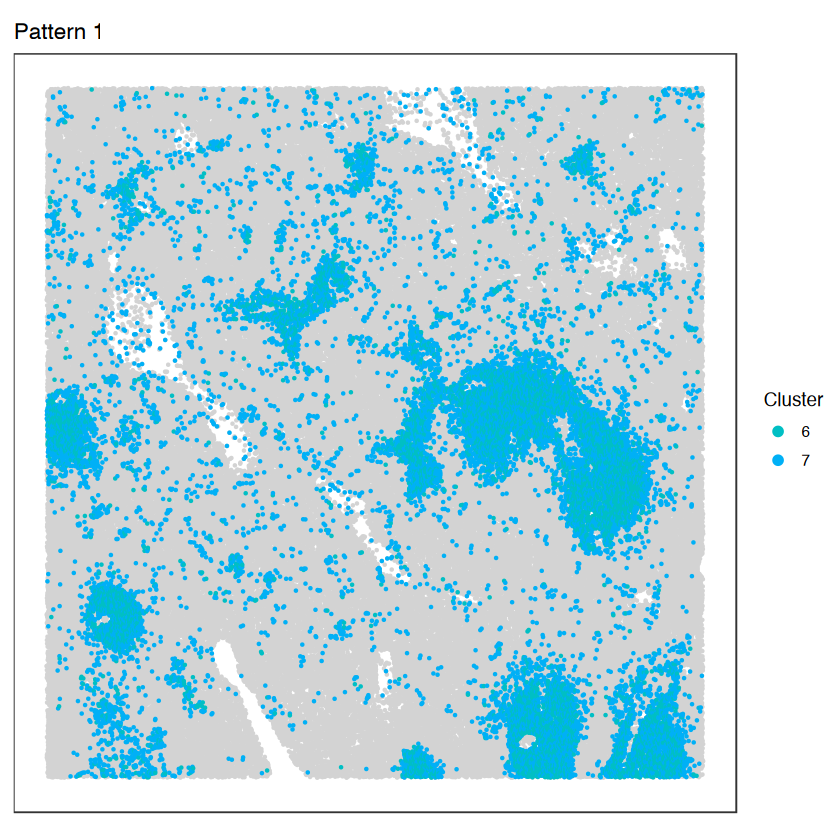

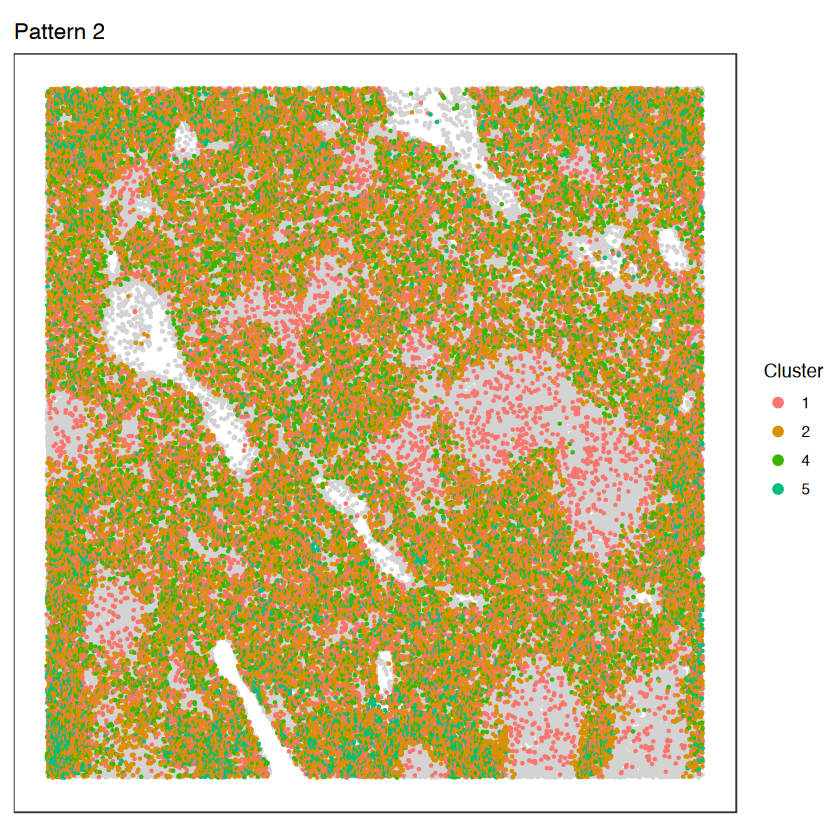

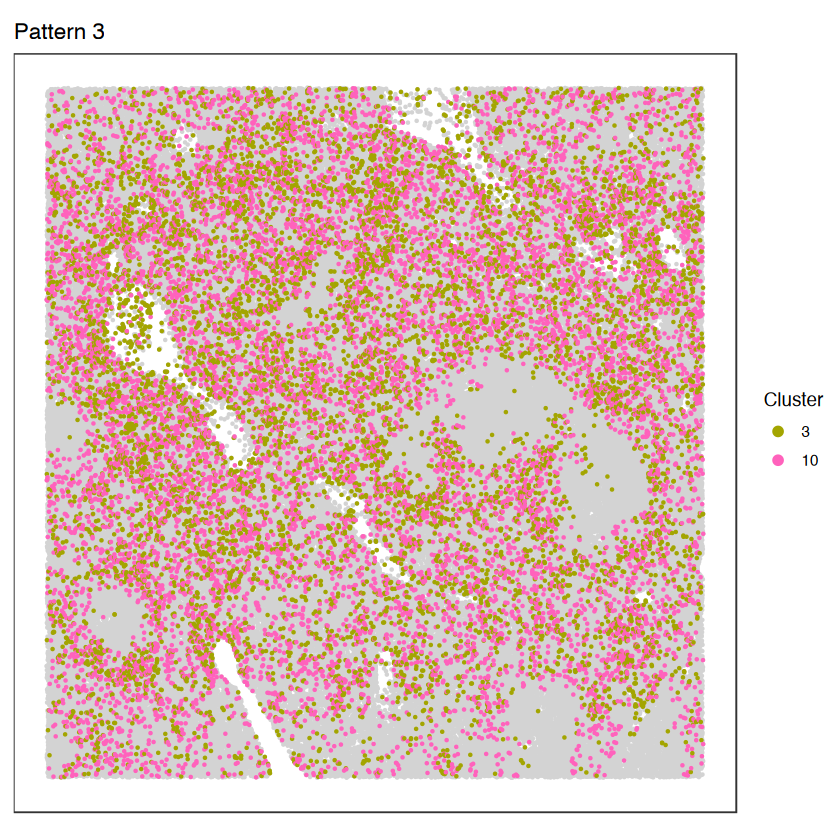

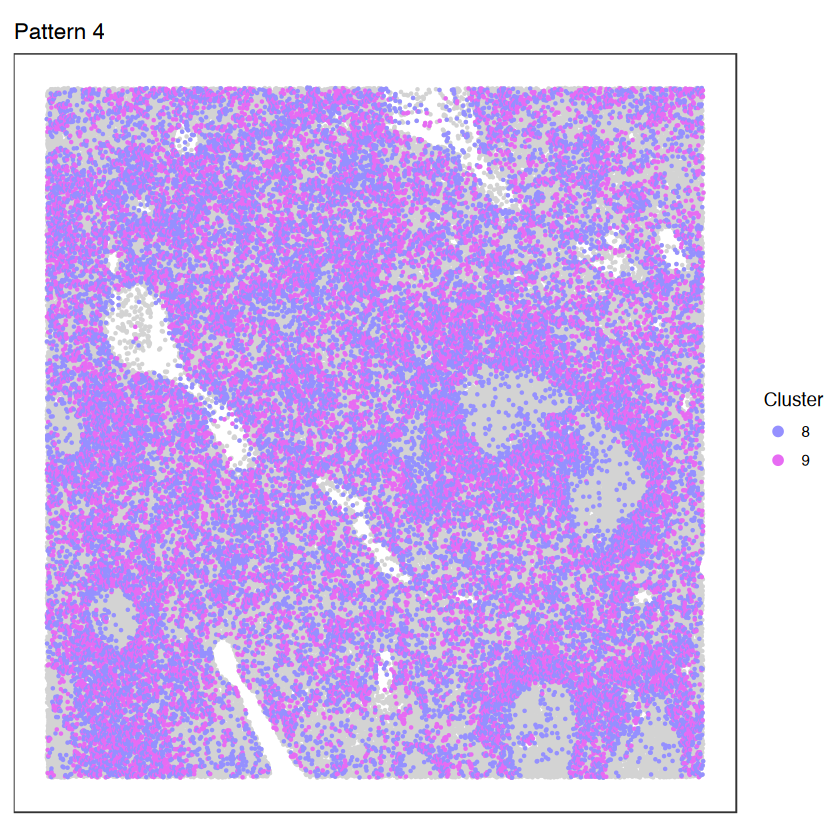

In [36]:
# visualize co-enrichment patterns at single-cell resolution
for (i in seq(patterns)) {
    # subset by clusters
    spe_sub <- spe[,colData(spe)[,col_name] %in% patterns[[i]]]
    
    # plot whole tissue
    df <- data.frame(spatialCoords(spe), celltype = colData(spe)[,col_name]) %>%
        mutate(celltype = factor(celltype))
    df_sub <- data.frame(spatialCoords(spe_sub), celltype = colData(spe_sub)[,col_name]) %>%
        mutate(celltype = factor(celltype))

    plt <- ggplot(df, aes(x = x, y = y)) +
        coord_fixed() +
        geom_point(color = "lightgray", size = 1, stroke = 0) +
        geom_point(data = df_sub, aes(x = x, y = y, col = celltype), size = 1, stroke = 0) +
        scale_color_manual(values = col_clu[patterns[[i]]]) +
        guides(col = guide_legend(override.aes = list(size = 3))) +
        # scale_color_manual(name = "Clusters", values = gg_color_hue(67)) +
        labs(title = paste0('Pattern ', i), x = "x (um)", y = "y (um)", col = "Cluster") +
        theme_bw() +
        theme(
            legend.position = "right",
            panel.grid = element_blank(),
            axis.title = element_blank(),
            axis.text = element_blank(),
            axis.ticks = element_blank(),
        )
    show(plt)
}